In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

In [2]:
df=pd.read_csv('DS3_C6_S3_Clustering_AbsenteeismAtWork_Data_Project.csv',sep=';')
df.head()

,ID,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,...,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
0,11,26,7,3,1,289,36,13,33,239.554,...,0,1,2,1,0,1,90,172,30,4
1,36,0,7,3,1,118,13,18,50,239.554,...,1,1,1,1,0,0,98,178,31,0
2,3,23,7,4,1,179,51,18,38,239.554,...,0,1,0,1,0,0,89,170,31,2
3,7,7,7,5,1,279,5,14,39,239.554,...,0,1,2,1,1,0,68,168,24,4
4,11,23,7,5,1,289,36,13,33,239.554,...,0,1,2,1,0,1,90,172,30,2


In [3]:
df.drop('ID',axis=1,inplace=True)

In [4]:
name=pd.read_csv('DS3_C6_S3_Clustering_AbsenteeismAtWork_Data_Project.csv',sep=';')
name.head()

,ID,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,...,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
0,11,26,7,3,1,289,36,13,33,239.554,...,0,1,2,1,0,1,90,172,30,4
1,36,0,7,3,1,118,13,18,50,239.554,...,1,1,1,1,0,0,98,178,31,0
2,3,23,7,4,1,179,51,18,38,239.554,...,0,1,0,1,0,0,89,170,31,2
3,7,7,7,5,1,279,5,14,39,239.554,...,0,1,2,1,1,0,68,168,24,4
4,11,23,7,5,1,289,36,13,33,239.554,...,0,1,2,1,0,1,90,172,30,2


In [5]:
name['Reason for absence'].replace([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 23, 24,
 25, 26, 27, 28],['Certain infectious and parasitic diseases' ,'Neoplasms', 
'Diseases of the blood and blood-forming organs and certain disorders involving the immune mechanism',
'Endocrine, nutritional and metabolic diseases', 
'Mental and behavioural disorders', 
'Diseases of the nervous system', 
'Diseases of the eye and adnexa', 
'Diseases of the ear and mastoid process',
'Diseases of the circulatory system', 
'Diseases of the respiratory system', 
'Diseases of the digestive system',
'Diseases of the skin and subcutaneous tissue', 
'Diseases of the musculoskeletal system and connective tissue',
'Diseases of the genitourinary system',
'Pregnancy, childbirth and the puerperium',
'Certain conditions originating in the perinatal period',
'Congenital malformations, deformations and chromosomal abnormalities', 
'Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified' ,
'Injury, poisoning and certain other consequences of external causes',
'External causes of morbidity and mortality',
'Factors influencing health status and contact with health services', 'patient follow-up', 'medical consultation','blood donation','laboratory examination','unjustified absence', 'physiotherapy','dental consultation'],inplace=True)

In [6]:
len([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

13

In [7]:
name['Day of the week'].replace([2, 3, 4, 5, 6],['Monday','Tuesday','Wednesday','Thursday','Friday'],inplace=True)

In [8]:
name['Seasons'].replace([1, 2, 3, 4],['summer','autumn','winter','spring'],inplace=True)

In [9]:
name['Social smoker'].replace([1,0],['yes','no'],inplace=True) 

In [10]:
name['Social drinker'].replace([1,0],['yes','no'],inplace=True) 

In [11]:
name['Disciplinary failure'].replace([1,0],['yes','no'],inplace=True)

In [12]:
name['Education'].replace([1 ,2 ,3 ,4],['high school','graduate','postgraduate','master and doctor'],inplace=True)

<AxesSubplot:>

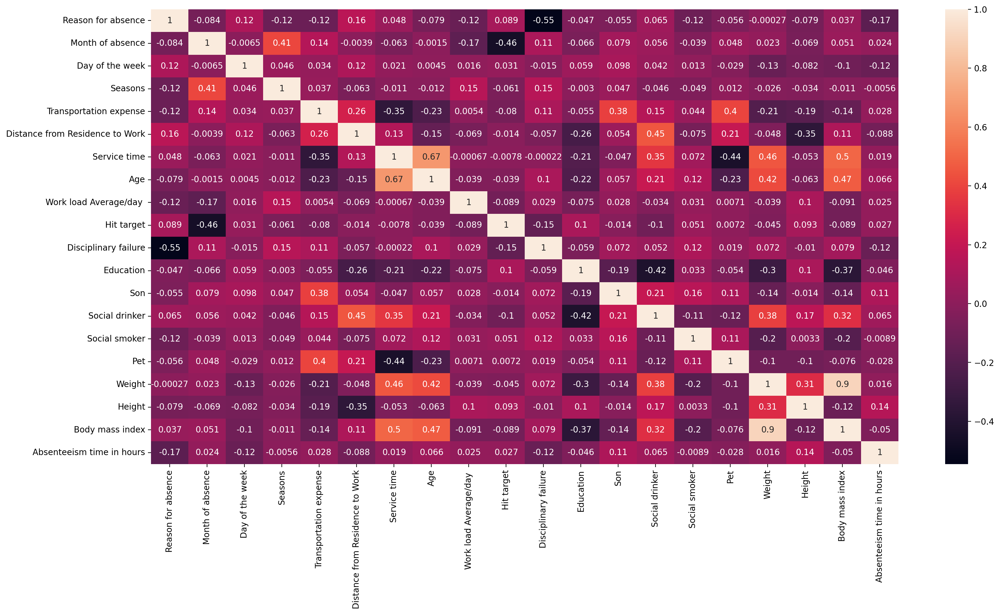

In [13]:
plt.figure(figsize=(20,10),dpi=200)
sns.heatmap(df.corr(),annot=True)


In [14]:
def seprate_data_types(df):
    categorical = []
    continuous = []
    for column in df.columns:               
        if df[column].nunique() < 29:       
                                                   
            categorical.append(column)
        else:
            continuous.append(column)
            
    return categorical, continuous 


categorical, continuous = seprate_data_types(df)

In [15]:
for i in df.columns:
    print(i,":",df[i].sort_values().unique())

Reason for absence : [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 21 22 23 24
 25 26 27 28]
Month of absence : [ 0  1  2  3  4  5  6  7  8  9 10 11 12]
Day of the week : [2 3 4 5 6]
Seasons : [1 2 3 4]
Transportation expense : [118 155 157 179 184 189 225 228 231 233 235 246 248 260 268 279 289 291
 300 330 361 369 378 388]
Distance from Residence to Work : [ 5 10 11 12 13 14 15 16 17 20 22 25 26 27 29 31 35 36 42 45 48 49 50 51
 52]
Service time : [ 1  3  4  6  7  8  9 10 11 12 13 14 15 16 17 18 24 29]
Age : [27 28 29 30 31 32 33 34 36 37 38 39 40 41 43 46 47 48 49 50 53 58]
Work load Average/day  : [205.917 222.196 230.29  236.629 237.656 239.409 239.554 241.476 244.387
 246.074 246.288 249.797 251.818 253.465 253.957 261.306 261.756 264.249
 264.604 265.017 265.615 268.519 271.219 275.089 275.312 280.549 284.031
 284.853 294.217 302.585 306.345 308.593 313.532 326.452 330.061 343.253
 377.55  378.884]
Hit target : [ 81  87  88  91  92  93  94  95  96  97  98  99 100]

In [16]:
obj=['Reason for absence', 'Month of absence','Day of the week','Day of the week', 'Seasons','Disciplinary failure', 'Social drinker','Social smoker']
num=[ 'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target','Education', 'Son', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours']

In [ ]:
num=[ 'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target','Education', 'Son', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours']

In [ ]:
col_index=[]
for i in num:
    col_index.append(df.columns.get_loc(i))

<AxesSubplot:xlabel='Reason for absence', ylabel='count'>

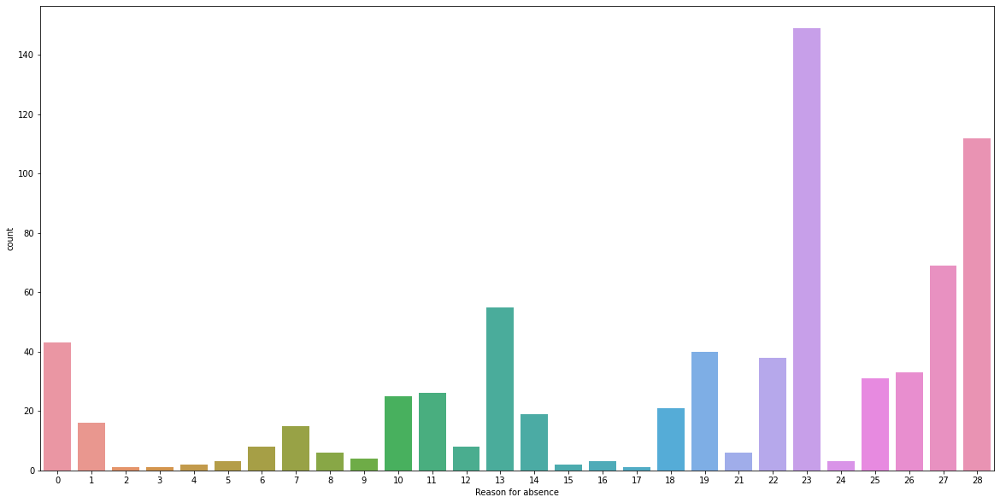

In [17]:
plt.figure(figsize=(20,10))
sns.countplot(data=df,x='Reason for absence')


In [18]:
name

,ID,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,...,Disciplinary failure,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours
0,11,unjustified absence,7,Tuesday,summer,289,36,13,33,239.554,...,no,high school,2,yes,no,1,90,172,30,4
1,36,Certain infectious and parasitic diseases,7,Tuesday,summer,118,13,18,50,239.554,...,yes,high school,1,yes,no,0,98,178,31,0
2,3,medical consultation,7,Wednesday,summer,179,51,18,38,239.554,...,no,high school,0,yes,no,0,89,170,31,2
3,7,Diseases of the ear and mastoid process,7,Thursday,summer,279,5,14,39,239.554,...,no,high school,2,yes,yes,0,68,168,24,4
4,11,medical consultation,7,Thursday,summer,289,36,13,33,239.554,...,no,high school,2,yes,no,1,90,172,30,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
735,11,"Pregnancy, childbirth and the puerperium",7,Tuesday,summer,289,36,13,33,264.604,...,no,high school,2,yes,no,1,90,172,30,8
736,1,Diseases of the skin and subcutaneous tissue,7,Tuesday,summer,235,11,14,37,264.604,...,no,postgraduate,1,no,no,1,88,172,29,4
737,4,Certain infectious and parasitic diseases,0,Tuesday,summer,118,14,13,40,271.219,...,no,high school,1,yes,no,8,98,170,34,0
738,8,Certain infectious and parasitic diseases,0,Wednesday,autumn,231,35,14,39,271.219,...,no,high school,2,yes,no,2,100,170,35,0


<AxesSubplot:xlabel='Month of absence', ylabel='count'>

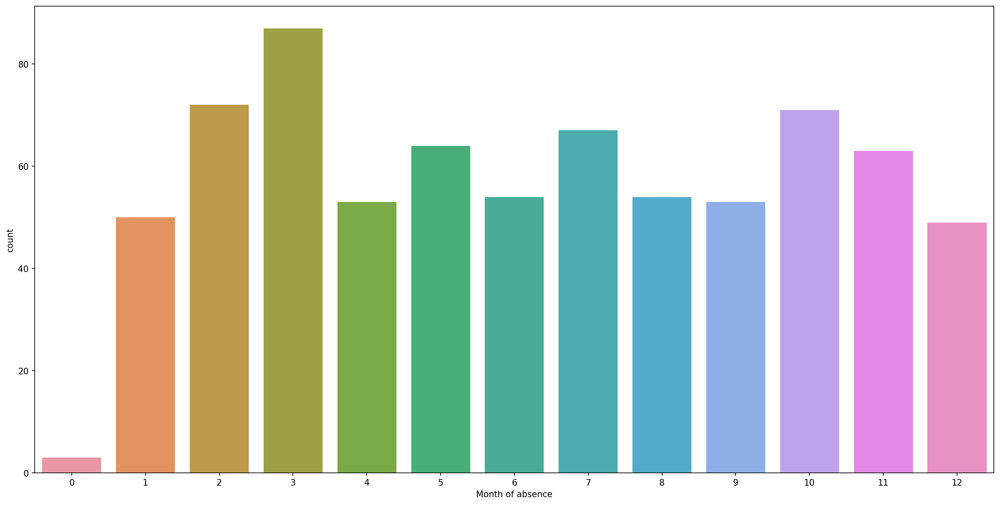

In [19]:
plt.figure(figsize=(20,10),dpi=150)
sns.countplot(data=df,x='Month of absence')


/var/folders/0k/fvxrc6xx287214q6n9hdy0500000gn/T/ipykernel_4833/2617947906.py:2: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.subplots_adjust(left= 0, bottom=0, right=3, top=12, wspace=0.09, hspace=0.3)


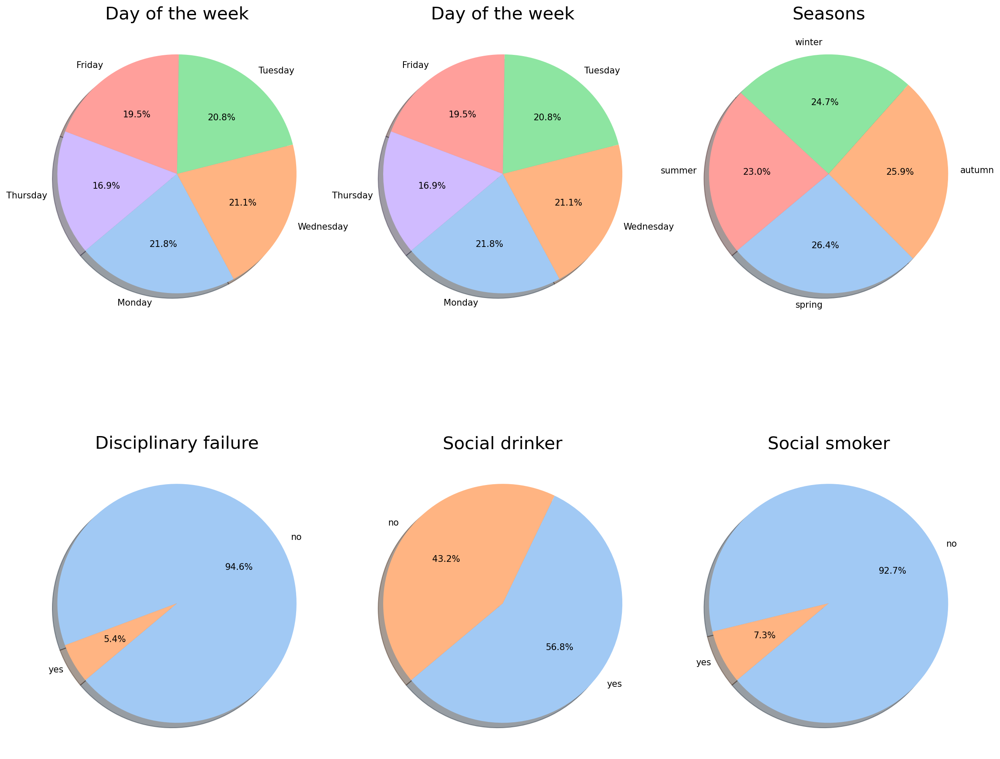

In [20]:

fig , axes = plt.subplots(nrows=2, ncols=3, constrained_layout=True,figsize=(5,1),dpi=150)                 # Plot Configuration 
fig.subplots_adjust(left= 0, bottom=0, right=3, top=12, wspace=0.09, hspace=0.3)
colors = sns.color_palette('pastel')[0:10]
for ax, column in zip(axes.flatten(),['Day of the week','Day of the week', 'Seasons','Disciplinary failure', 'Social drinker','Social smoker']): 
    ax.set_title(column,fontsize=20)
    data= name[column].value_counts()
    labels =  data.keys()    #labels = list(data.index)
    #fig.patch.set_facecolor('xkcd:white')
    ax.pie(data,labels =labels,colors=colors,autopct='%1.1f%%', shadow=True, startangle=220)
plt.show()

Text(0.5, 1.0, 'Seasons V/s Age')

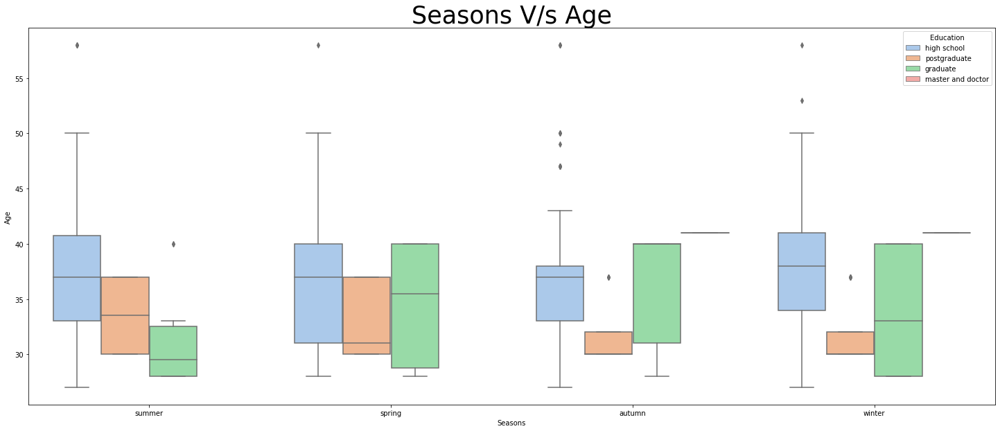

In [21]:
plt.figure(figsize=(25,10))
sns.boxplot(data =name, x='Seasons',y='Age',           
            hue ='Education',orient='v',palette=colors)
plt.title('Seasons V/s Age',fontsize=35 )


Text(0.5, 1.0, 'Seasons V/s Distance from Residence to Work')

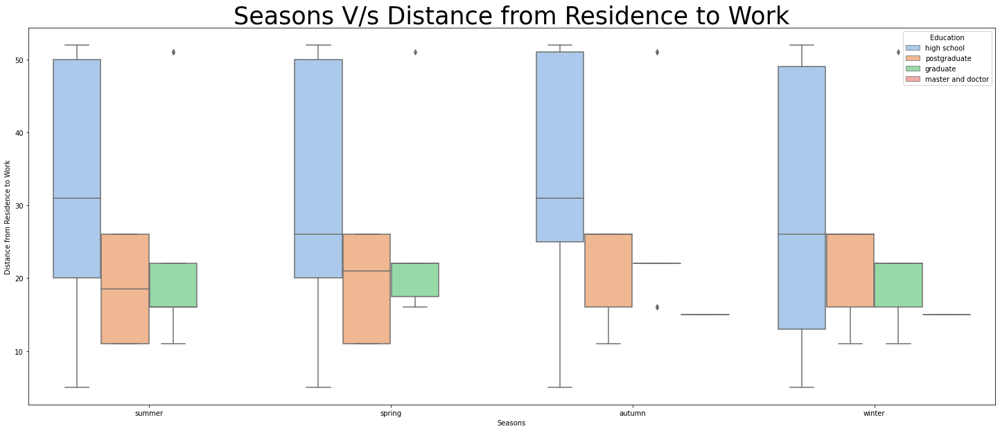

In [22]:
plt.figure(figsize=(25,10))
sns.boxplot(data =name, x='Seasons',y='Distance from Residence to Work',           
            hue ='Education',orient='v',palette=colors)
plt.title('Seasons V/s Distance from Residence to Work',fontsize=35 )

Text(0.5, 1.0, 'Seasons V/s Transportation expense')

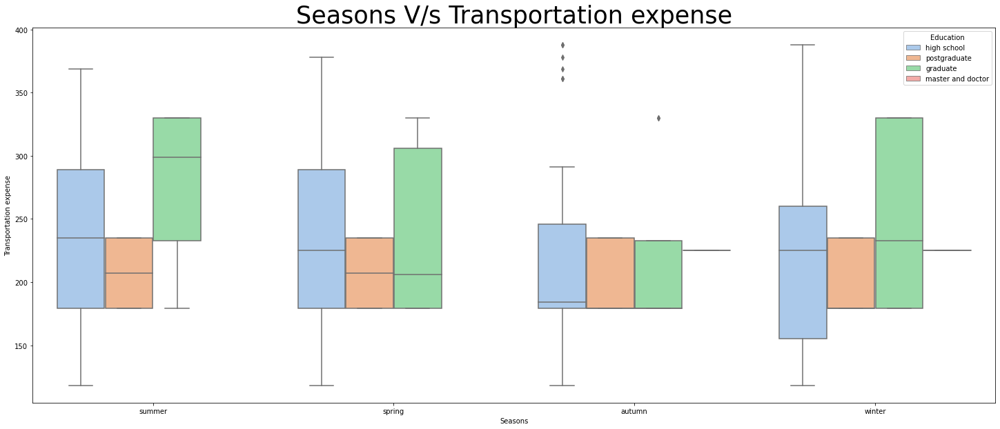

In [23]:
plt.figure(figsize=(25,10))
sns.boxplot(data =name, x='Seasons',y='Transportation expense',           
            hue ='Education',orient='v',palette=colors)
plt.title('Seasons V/s Transportation expense',fontsize=35 )


Text(0.5, 1.0, 'Distribution of Numerical Feature')

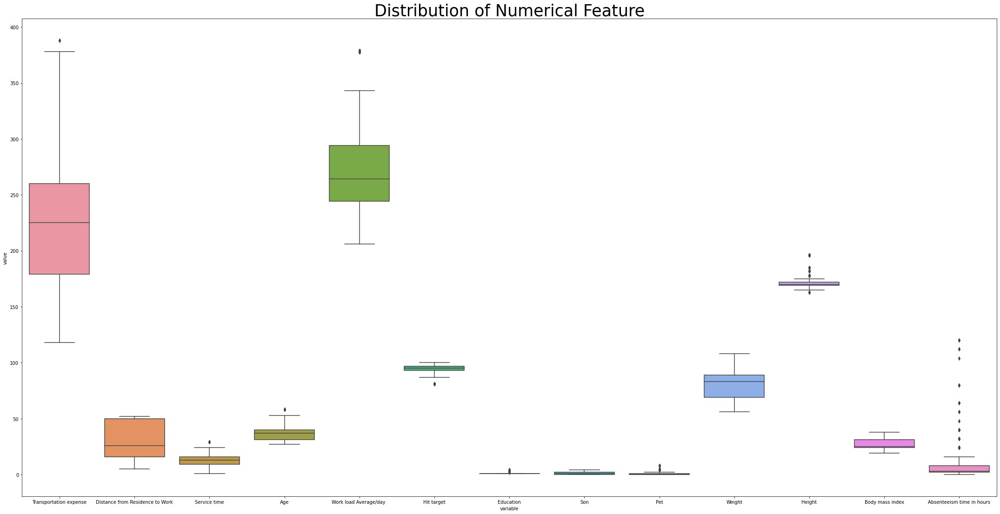

In [24]:
plt.figure(figsize=(30,15))
sns.boxplot(x="variable", y="value", data=pd.melt(df[num]))
plt.tight_layout()
plt.title('Distribution of Numerical Feature',fontsize=35 )


In [68]:
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.neighbors import KNeighborsClassifier,NearestNeighbors
from sklearn.preprocessing import MinMaxScaler,OneHotEncoder
from sklearn.cluster import KMeans, AgglomerativeClustering ,DBSCAN
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as sch
from sklearn.decomposition import PCA

In [ ]:
trans=make_column_transformer((MinMaxScaler(),num),(OneHotEncoder(),obj),remainder='passthrough')

In [33]:
km=KMeans()
db=DBSCAN()
hc=AgglomerativeClustering()
pipe_km=Pipeline([('scale',MinMaxScaler()),('clf',km)])
pipe_hc=Pipeline([('scale',MinMaxScaler()),('clf',hc)])
pipe_db=Pipeline([('scale',MinMaxScaler()),('clf',db)])

### K-Means
#### Elbow curve

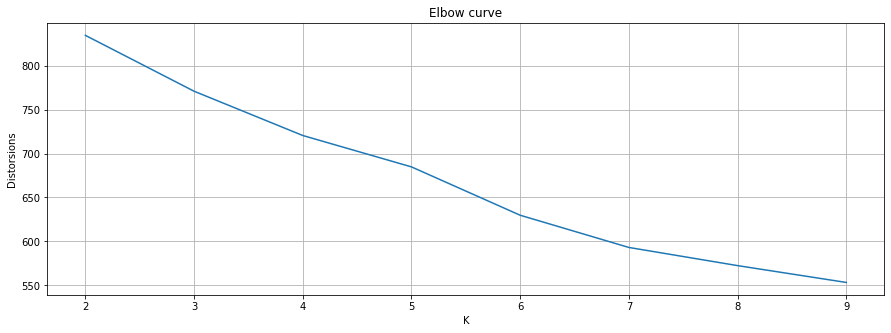

In [34]:
distorsions = []
for k in range(2, 10):
    kmean = pipe_km.set_params(clf__n_clusters=k,clf__random_state=0)
    kmean.fit(df)
    distorsions.append(kmean.named_steps['clf'].inertia_)
fig = plt.figure(figsize=(15, 5)) 
plt.plot(range(2, 10), distorsions) 
plt.grid(True)
plt.xlabel('K') 
plt.ylabel('Distorsions')
plt.title('Elbow curve');

##### elbow curve give n_clusters =5

#### silhouette score

In [37]:
from sklearn.metrics import silhouette_score
silhouett_s = []
for i in [2,3,4,5,6,7,8,9,10]:
  
  kmeans = pipe_km.set_params(clf__n_clusters=i,clf__random_state=0)
  kmeans.fit(df)
  labels = kmeans.named_steps['clf'].labels_
  score = silhouette_score(pipe_km[0].fit_transform(df),labels)
  print("Sillhouette Score for k = ", i,"is",round(score*100,2),'%')
  silhouett_s.append(score)

Sillhouette Score for k =  2 is 21.26 %
Sillhouette Score for k =  3 is 17.07 %
Sillhouette Score for k =  4 is 17.8 %
Sillhouette Score for k =  5 is 16.39 %
Sillhouette Score for k =  6 is 16.08 %
Sillhouette Score for k =  7 is 17.27 %
Sillhouette Score for k =  8 is 15.69 %
Sillhouette Score for k =  9 is 15.78 %
Sillhouette Score for k =  10 is 17.54 %


In [38]:
final_km=pipe_km.set_params(clf__n_clusters=2,clf__random_state=0)

### Hierarchical clustering

#### Dendrogram

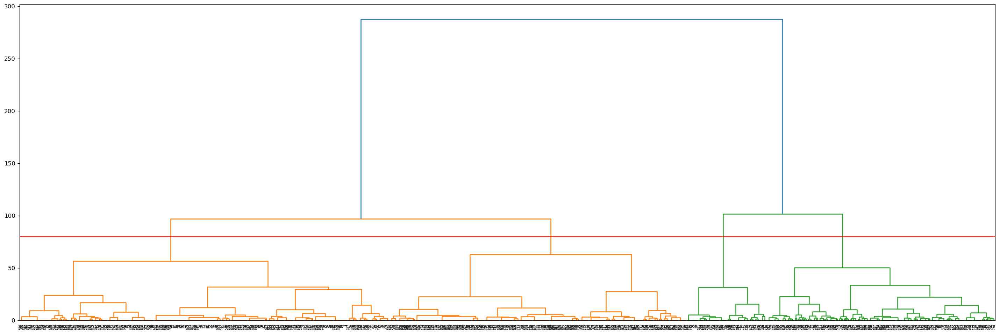

In [40]:
plt.figure(figsize=(30,10),dpi=120)
sch.dendrogram(sch.linkage(df.iloc[:,[0,1]],method='ward'),labels=df.index)
plt.axhline(y=80,color='r')

In [41]:
final_hc=pipe_hc.set_params(clf__n_clusters=4,clf__affinity='euclidean',clf__linkage='ward')

#### DBSCAN

In [44]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(pipe_km[0].fit_transform(df))
distances, indices = nbrs.kneighbors(pipe_km[0].fit_transform(df))
distances = np.sort(distances, axis=0)
distances = distances[:,1]

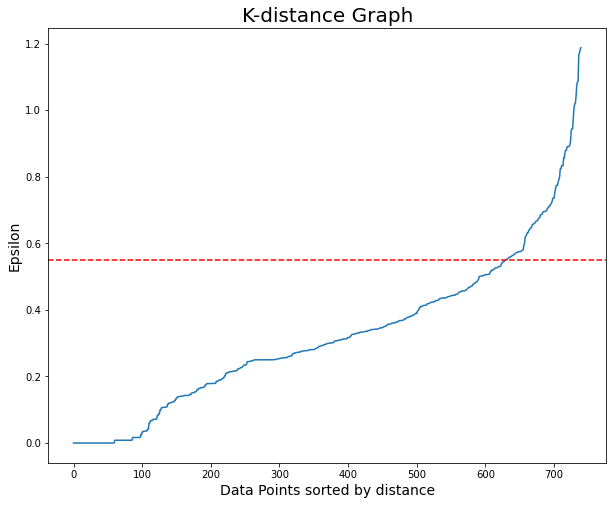

In [47]:
plt.figure(figsize=(10,8))
plt.plot(distances)
plt.axhline(y=0.55, color='r', linestyle='--')
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [53]:
eps=0.55
for min in range(10,30):
    clusterer = pipe_db.set_params(clf__eps=0.55,clf__min_samples=min)
    cluster_labels = clusterer.fit_predict(df)
    x= cluster_labels +2
    y = np.bincount(x)
    ii = np.nonzero(y)[0]
    results = list(zip(ii,y[ii]))
    print('eps=',eps,'| min_samples= ', min, '| obtained clustering: ', results)

eps= 0.55 | min_samples=  10 | obtained clustering:  [(1, 479), (2, 14), (3, 74), (4, 65), (5, 21), (6, 12), (7, 11), (8, 13), (9, 17), (10, 24), (11, 10)]
eps= 0.55 | min_samples=  11 | obtained clustering:  [(1, 495), (2, 14), (3, 73), (4, 65), (5, 21), (6, 12), (7, 11), (8, 11), (9, 17), (10, 21)]
eps= 0.55 | min_samples=  12 | obtained clustering:  [(1, 534), (2, 14), (3, 73), (4, 65), (5, 18), (6, 18), (7, 18)]
eps= 0.55 | min_samples=  13 | obtained clustering:  [(1, 536), (2, 13), (3, 73), (4, 65), (5, 18), (6, 17), (7, 18)]
eps= 0.55 | min_samples=  14 | obtained clustering:  [(1, 549), (2, 73), (3, 33), (4, 18), (5, 32), (6, 17), (7, 18)]
eps= 0.55 | min_samples=  15 | obtained clustering:  [(1, 589), (2, 70), (3, 33), (4, 16), (5, 32)]
eps= 0.55 | min_samples=  16 | obtained clustering:  [(1, 590), (2, 33), (3, 16), (4, 32), (5, 69)]
eps= 0.55 | min_samples=  17 | obtained clustering:  [(1, 608), (2, 33), (3, 30), (4, 69)]
eps= 0.55 | min_samples=  18 | obtained clustering:  

In [54]:
final_db=pipe_db.set_params(clf__eps=0.55,clf__min_samples=17)

## Visuals

In [165]:
col_index

[4, 5, 6, 7, 8, 9, 11, 12, 15, 16, 17, 18, 19]

### K-Mean

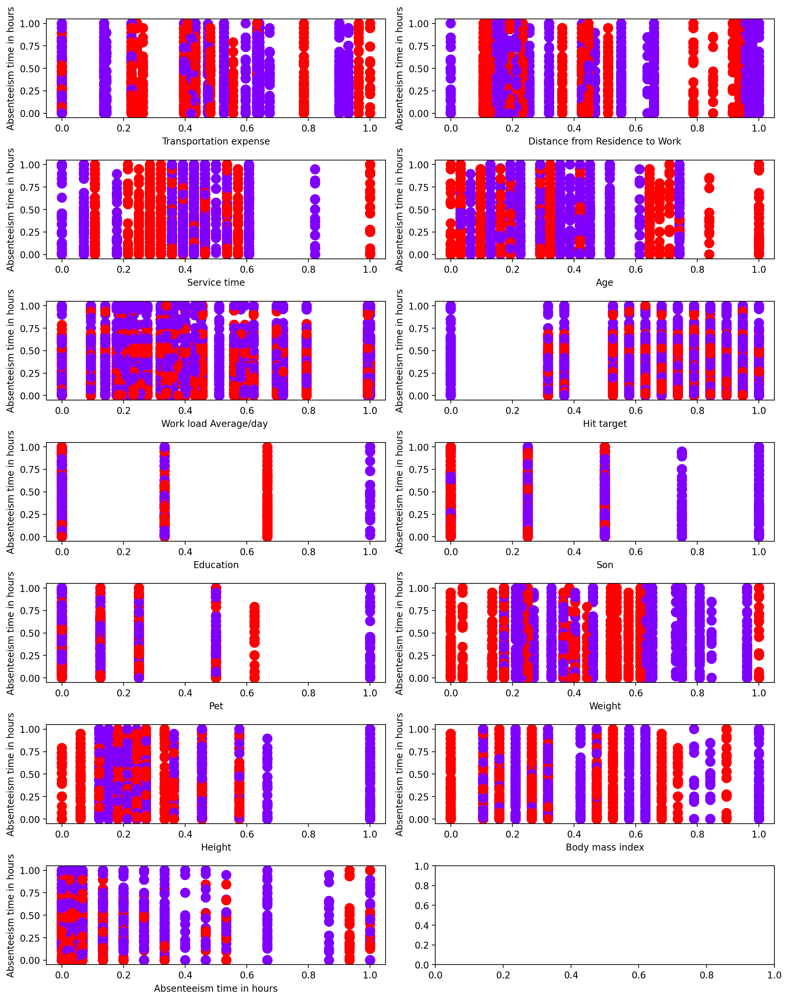

In [167]:
lab_c= df.columns
final_km.fit(df)
fig,ax=plt.subplots(7,2,figsize=(12,15),dpi=200)
labels = final_km[1].labels_
for i,_ in zip([4, 5, 6, 7, 8, 9, 11, 12, 15, 16, 17, 18, 19],ax.flatten()):
    for j in [4, 5, 6, 7, 8, 9, 11, 12, 15, 16, 17, 18, 19]:
        _.scatter(final_km[0].fit_transform(df)[:, i], final_km[0].fit_transform(df)[:,j],c=labels.astype(float),cmap='rainbow_r',s=100)
        _.set_xlabel(lab_c[i])
        _.set_ylabel(lab_c[j])
        plt.tight_layout()

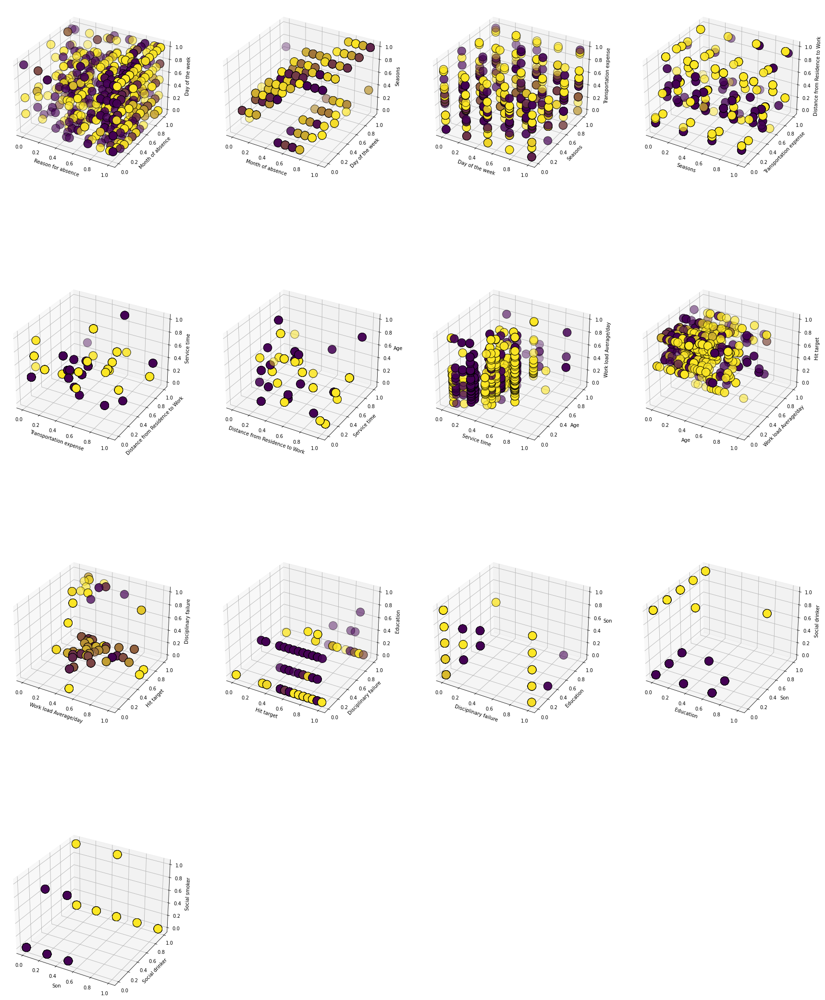

In [66]:
fig = plt.figure(figsize=(30, 40))

final_km.fit(df)
labels = final_km[1].labels_
for i in range(13):
    ax=fig.add_subplot(4,4,i+1, projection="3d")
    ax.scatter(final_km[0].fit_transform(df)[:, i], final_km[0].fit_transform(df)[:, i+1], final_km[0].fit_transform(df)[:, i+2], c=labels.astype(float), edgecolor="k",s=300)
    ax.set_xlabel(lab_c[i])
    ax.set_ylabel(lab_c[i+1])
    ax.set_zlabel(lab_c[i+2])

### Hierarchical clustering

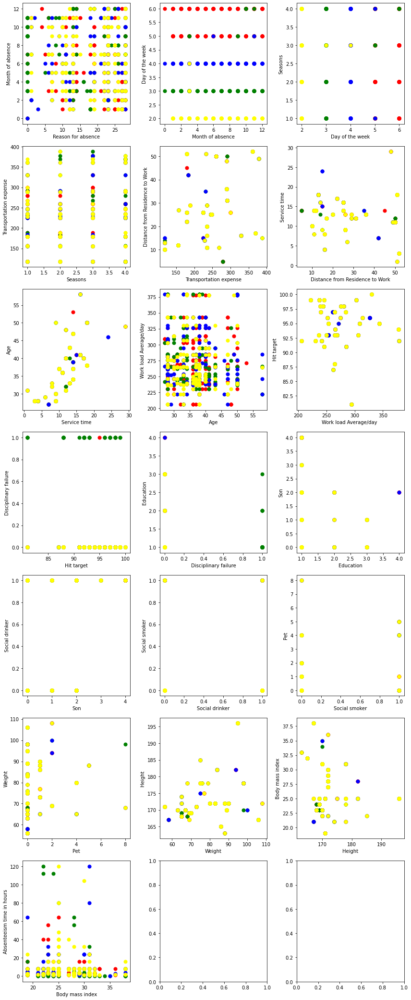

In [ ]:
try:
    y_p=final_hc.fit_predict(df)
    color = ['red','green','blue','yellow']
    fig,ax=plt.subplots(7,3,figsize=(12,29))
    for num,_ in enumerate(ax.flatten()):
        for i in range(4):
            _.scatter(df.values[y_p==i,num],df.values[y_p==i,num+1],s=50,c=color[i])
            _.set_xlabel(lab_c[num])
            _.set_ylabel(lab_c[num+1])
            plt.tight_layout()
except:
    pass

### DBSCAN

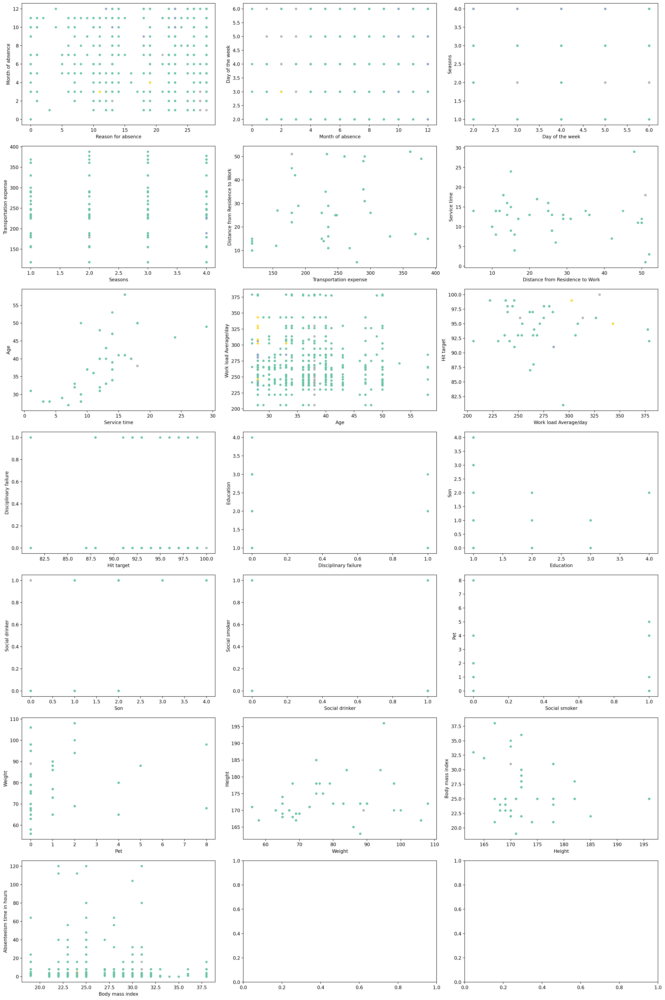

In [64]:
try:
    fig,ax=plt.subplots(7,3,figsize=(20,30),dpi=200)
    for i,_ in enumerate(ax.flatten()):
        final_db.fit(df)
        _.scatter(df.iloc[:,i], df.iloc[:,i+1], c=final_db[1].labels_,cmap='Set2',s=15)
        _.set_xlabel(lab_c[i])
        _.set_ylabel(lab_c[i+1])
        plt.tight_layout()
except:
    pass

In [58]:
df_label=pd.DataFrame(pipe_km[0].fit_transform(df),columns=df.columns)

In [59]:
df_label['km_label']=final_km[1].labels_
df_label['hc_label']=final_hc.fit_predict(df)
df_label['db_label']=final_db[1].labels_

### K_Mean

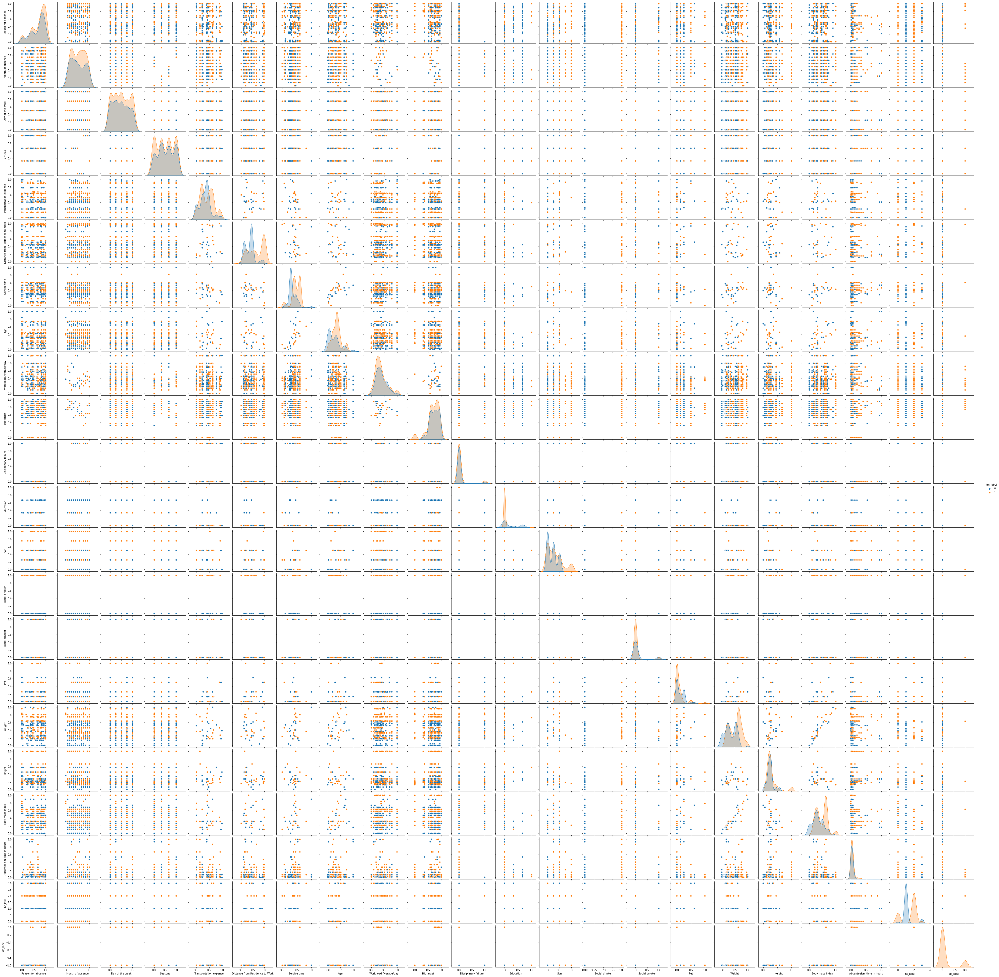

In [60]:
sns.pairplot(df_label,hue='km_label')

### Hierarchical clustering

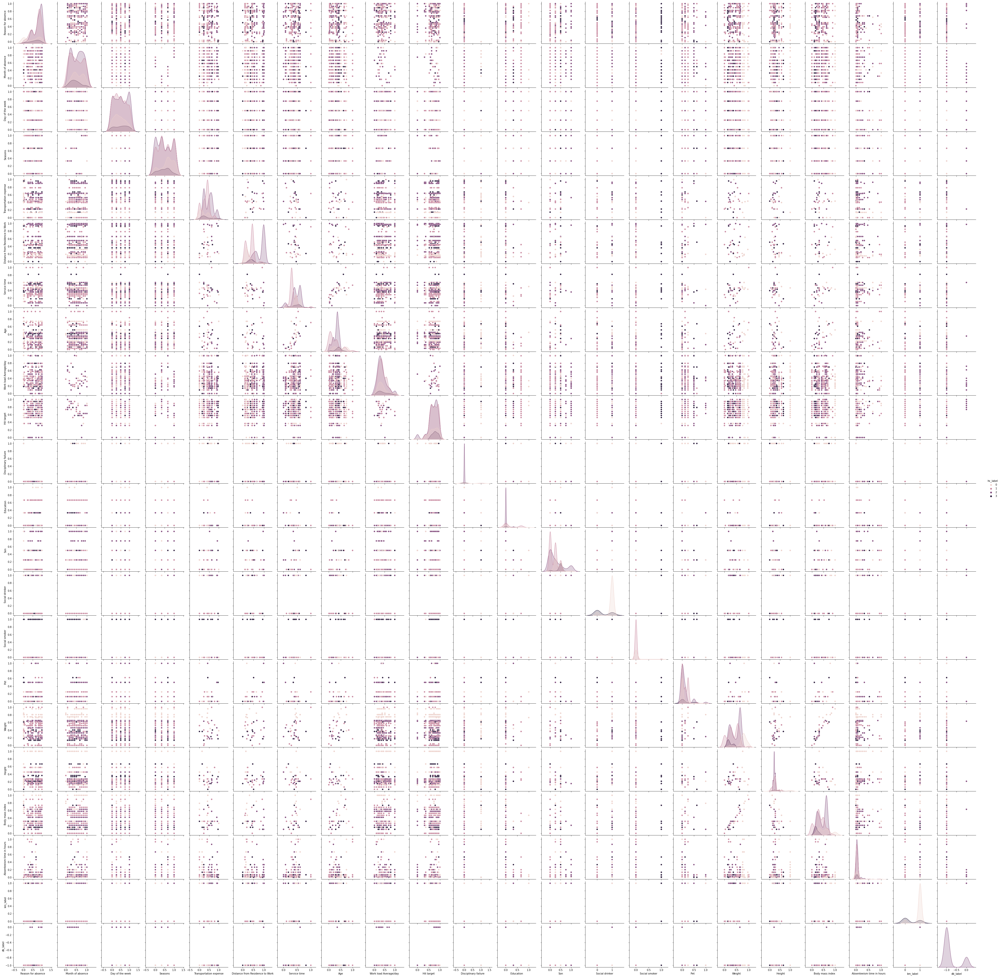

In [61]:
sns.pairplot(df_label,hue='hc_label');

### DBSCAN

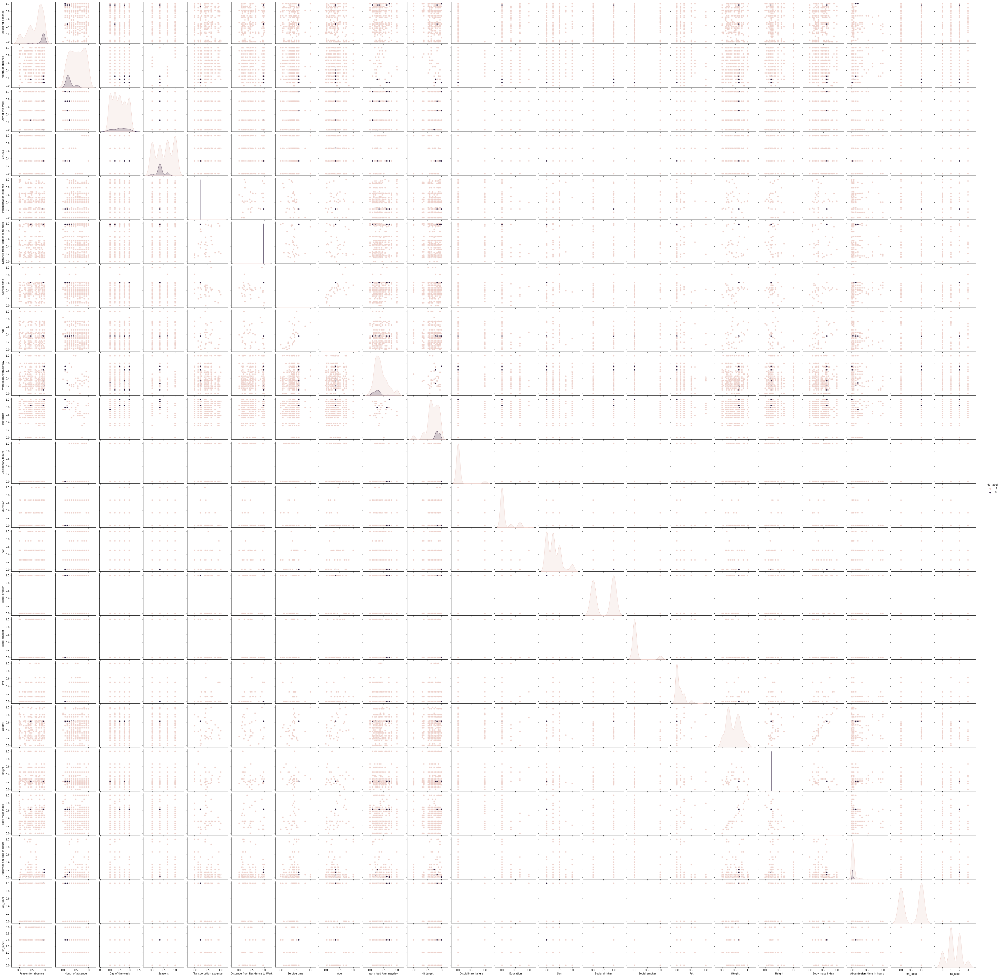

In [63]:
sns.pairplot(df_label,hue='db_label');

## PCA

In [96]:
km=KMeans()
db=DBSCAN()
hc=AgglomerativeClustering()
pca_km=Pipeline([('scale',MinMaxScaler()),('pca',PCA(n_components=4)),('clf',km)])
pca_hc=Pipeline([('scale',MinMaxScaler()),('pca',PCA(n_components=4)),('clf',hc)])
pca_db=Pipeline([('scale',MinMaxScaler()),('pca',PCA(n_components=4)),('clf',db)])

In [97]:
pca_km[1].fit_transform(df)
np.sum(pca_km.named_steps['pca'].explained_variance_ratio_)


0.9506949362563218

### K-Means
#### Elbow curve

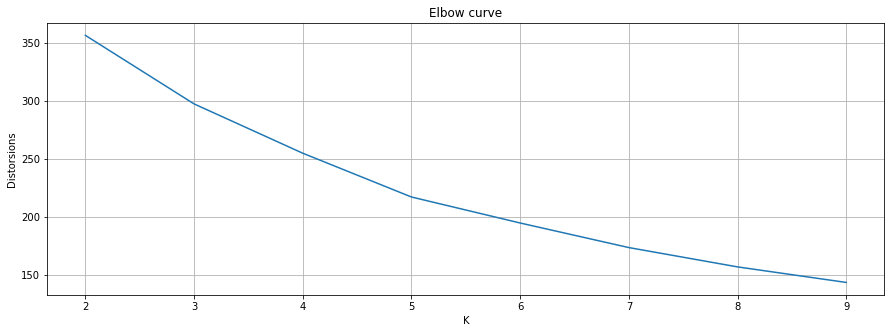

In [98]:
distorsions = []
for k in range(2, 10):
    kmean = pca_km.set_params(clf__n_clusters=k,clf__random_state=0)
    kmean.fit(df)
    distorsions.append(kmean.named_steps['clf'].inertia_)
fig = plt.figure(figsize=(15, 5)) 
plt.plot(range(2, 10), distorsions) 
plt.grid(True)
plt.xlabel('K') 
plt.ylabel('Distorsions')
plt.title('Elbow curve');

##### elbow curve give n_clusters =5

#### silhouette score

In [101]:
from sklearn.metrics import silhouette_score
silhouett_s = []
for i in [2,3,4,5,6,7,8,9,10]:
  
  kmeans = pca_km.set_params(clf__n_clusters=i,clf__random_state=0)
  kmeans.fit(df)
  labels = kmeans.named_steps['clf'].labels_
  score = silhouette_score(pca_km[:2].fit_transform(df),labels)
  print("Sillhouette Score for k = ", i,"is",round(score*100,2),'%')
  silhouett_s.append(score)

Sillhouette Score for k =  2 is 36.95 %
Sillhouette Score for k =  3 is 30.98 %
Sillhouette Score for k =  4 is 29.01 %
Sillhouette Score for k =  5 is 29.51 %
Sillhouette Score for k =  6 is 27.87 %
Sillhouette Score for k =  7 is 28.28 %
Sillhouette Score for k =  8 is 28.72 %
Sillhouette Score for k =  9 is 28.48 %
Sillhouette Score for k =  10 is 29.15 %


In [110]:
final_pca_km=pca_km.set_params(clf__n_clusters=2,clf__random_state=0)

### Hierarchical clustering

#### Dendrogram

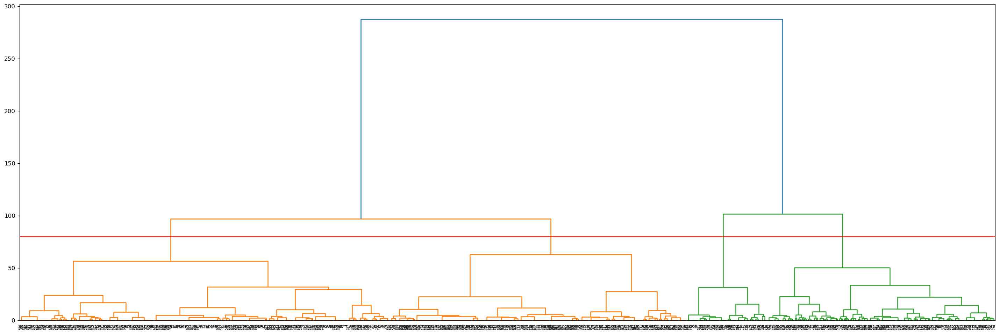

In [ ]:
plt.figure(figsize=(30,10),dpi=120)
sch.dendrogram(sch.linkage(df.iloc[:,[0,1]],method='ward'),labels=df.index)
plt.axhline(y=80,color='r')

In [102]:
final_pca_hc=pca_hc.set_params(clf__n_clusters=4,clf__affinity='euclidean',clf__linkage='ward')

#### DBSCAN

In [103]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(pca_km[:2].fit_transform(df))
distances, indices = nbrs.kneighbors(pca_km[:2].fit_transform(df))
distances = np.sort(distances, axis=0)
distances = distances[:,1]

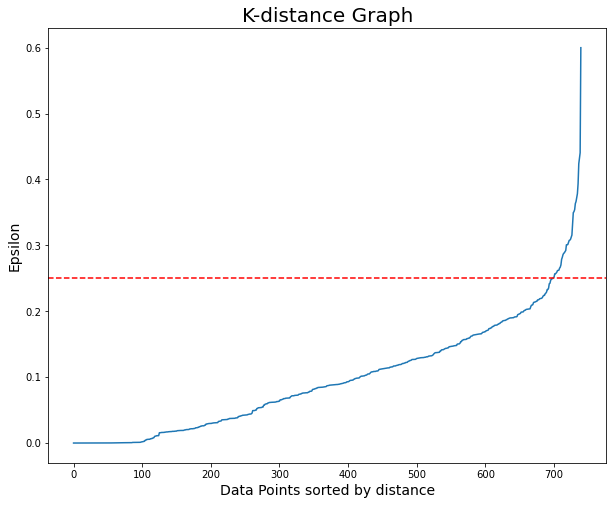

In [105]:
plt.figure(figsize=(10,8))
plt.plot(distances)
plt.axhline(y=0.25, color='r', linestyle='--')
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [175]:
eps=0.25
for min in range(7):
    clusterer = pca_db.set_params(clf__eps=0.55,clf__min_samples=min)
    cluster_labels = clusterer.fit_predict(df)
    x= cluster_labels +2
    y = np.bincount(x)
    ii = np.nonzero(y)[0]
    results = list(zip(ii,y[ii]))
    print('eps=',eps,'| min_samples= ', min, '| obtained clustering: ', results)

eps= 0.25 | min_samples=  0 | obtained clustering:  [(2, 736), (3, 3), (4, 1)]
eps= 0.25 | min_samples=  1 | obtained clustering:  [(2, 736), (3, 3), (4, 1)]
eps= 0.25 | min_samples=  2 | obtained clustering:  [(1, 1), (2, 736), (3, 3)]
eps= 0.25 | min_samples=  3 | obtained clustering:  [(1, 1), (2, 736), (3, 3)]
eps= 0.25 | min_samples=  4 | obtained clustering:  [(1, 4), (2, 733), (3, 3)]
eps= 0.25 | min_samples=  5 | obtained clustering:  [(1, 7), (2, 733)]
eps= 0.25 | min_samples=  6 | obtained clustering:  [(1, 7), (2, 733)]


In [108]:
final_pca_db=pca_db.set_params(clf__eps=0.25,clf__min_samples=3)

## Visuals

### K-Mean

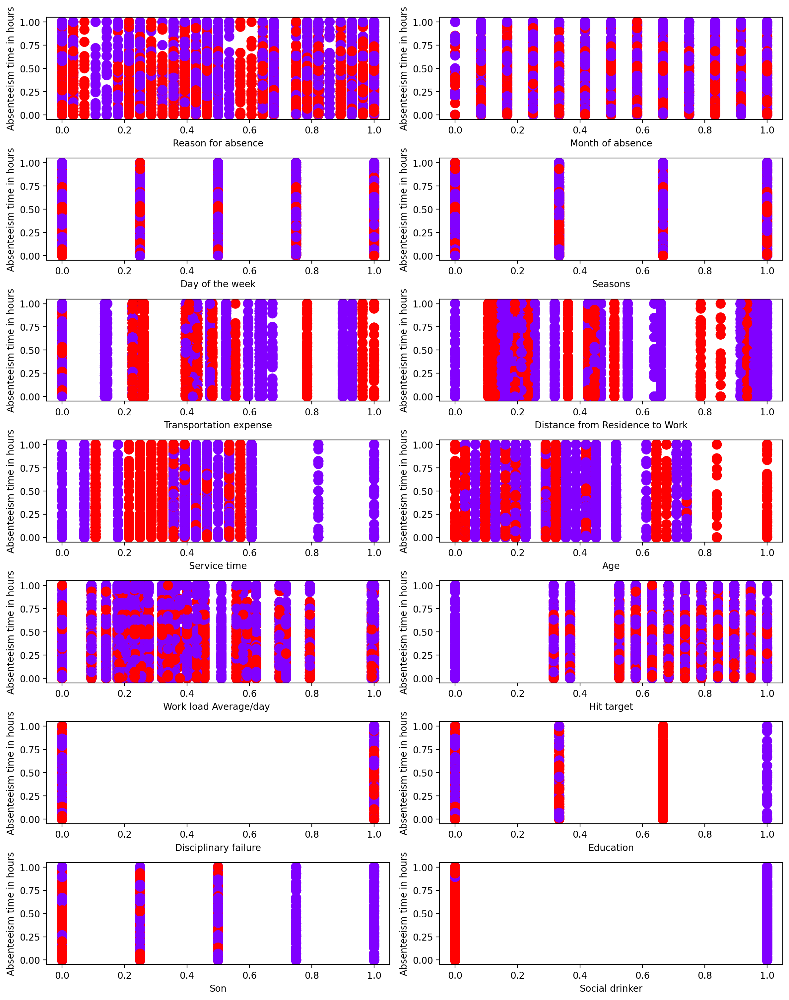

In [173]:
lab_c= df.columns
final_pca_km.fit(df)
fig,ax=plt.subplots(7,2,figsize=(12,15),dpi=200)
labels = final_pca_km[2].labels_
for i,_ in zip(range(21),ax.flatten()):
    for j in range(20):
        _.scatter(final_km[0].fit_transform(df)[:, i], final_km[0].fit_transform(df)[:,j],c=labels.astype(float),cmap='rainbow_r',s=100)
        _.set_xlabel(lab_c[i])
        _.set_ylabel(lab_c[j])
        plt.tight_layout()

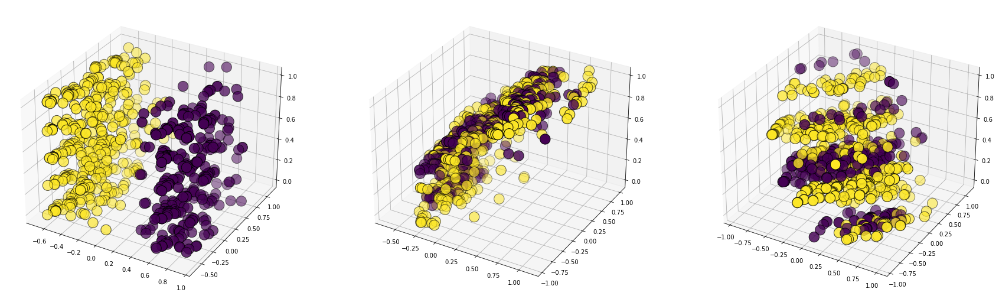

In [128]:
fig = plt.figure(figsize=(30, 40))
try:
    final_pca_km.fit(df)
    labels = final_pca_km[2].labels_
    for i in range(13):
        ax=fig.add_subplot(1,3,i+1, projection="3d")
        ax.scatter(final_pca_km[:2].fit_transform(df)[:, i], final_pca_km[:2].fit_transform(df)[:, i+1], final_pca_km[0].fit_transform(df)[:, i+2], c=labels.astype(float), edgecolor="k",s=300)
    
except:
    pass

### Hierarchical clustering

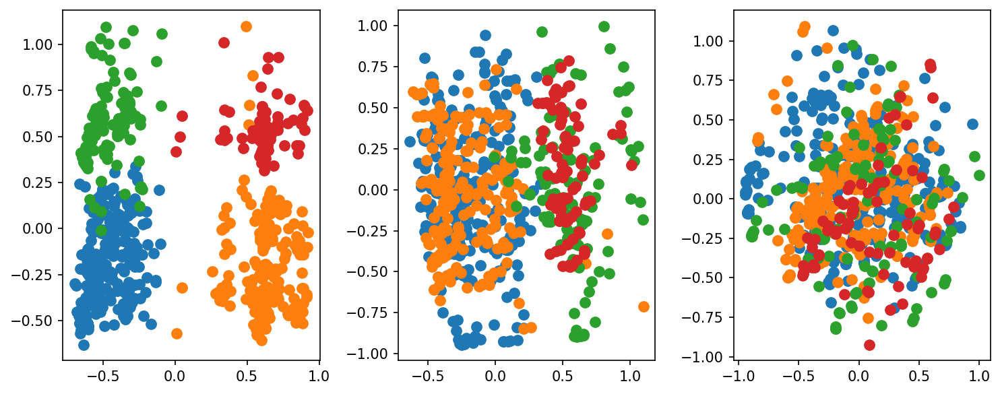

In [136]:
try:
    y_p=final_pca_hc.fit_predict(df)
    fig,ax=plt.subplots(1,3,figsize=(10,4),dpi=150)
    for num,_ in enumerate(ax.flatten()):
        for i in range(4):
            _.scatter(final_pca_hc[:2].fit_transform(df)[y_p==i,num],final_pca_hc[:2].fit_transform(df)[y_p==i,num+1],s=50,cmap='rainbow_r')
            plt.tight_layout()
except:
    pass

### DBSCAN

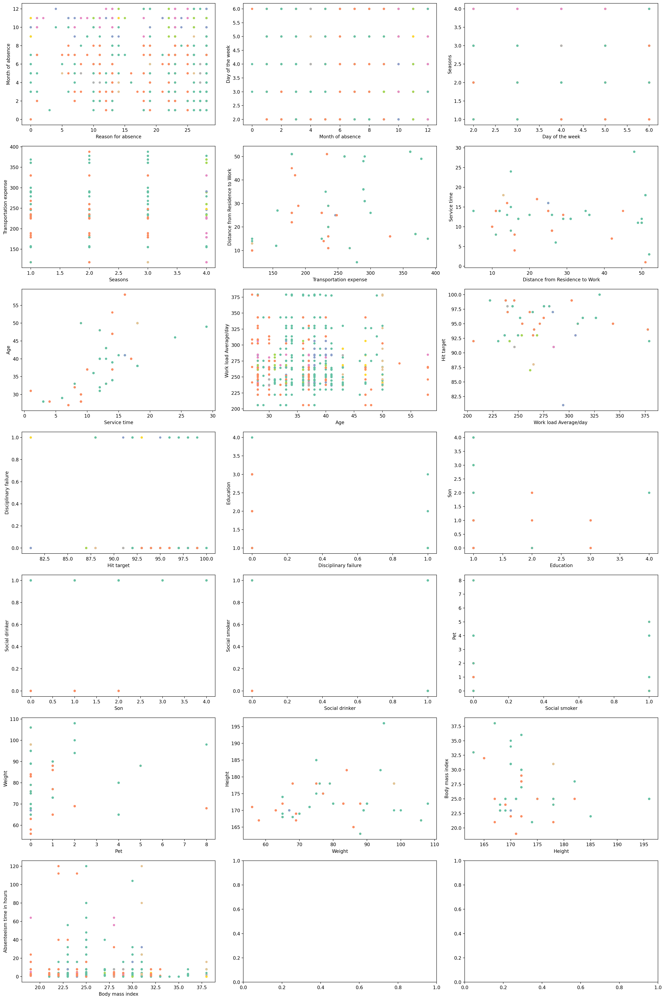

In [116]:
try:
    fig,ax=plt.subplots(7,3,figsize=(20,30),dpi=200)
    for i,_ in enumerate(ax.flatten()):
        final_pca_db.fit(df)
        _.scatter(df.iloc[:,i], df.iloc[:,i+1], c=final_pca_db[2].labels_,cmap='Set2',s=15)
        _.set_xlabel(lab_c[i])
        _.set_ylabel(lab_c[i+1])
        plt.tight_layout()
except:
    pass

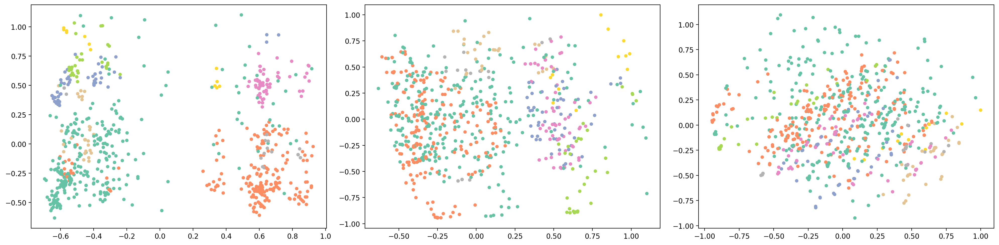

In [137]:
try:
    fig,ax=plt.subplots(1,3,figsize=(20,5),dpi=200)
    for i,_ in enumerate(ax.flatten()):
        final_pca_db.fit(df)
        _.scatter(final_pca_hc[:2].fit_transform(df)[:,i], final_pca_hc[:2].fit_transform(df)[:,i+1], c=final_pca_db[2].labels_,cmap='Set2',s=15)
        plt.tight_layout()
except:
    pass

In [148]:
silhouette_score(final_pca_km[:2].fit_transform(df),final_pca_db.fit(df).named_steps['clf'].labels_)

0.07498413195580055

In [149]:
pd.DataFrame({'Kmean':[silhouette_score(final_km[0].fit_transform(df),final_km.fit(df).named_steps['clf'].labels_),
silhouette_score(final_pca_km[:2].fit_transform(df),final_pca_km.fit(df).named_steps['clf'].labels_)],
'Agglomerative':[silhouette_score(final_km[0].fit_transform(df),final_hc.fit(df).named_steps['clf'].labels_), 
silhouette_score(final_pca_km[:2].fit_transform(df),final_pca_hc.fit(df).named_steps['clf'].labels_)],
'DBSCAN':[silhouette_score(final_km[0].fit_transform(df),final_db.fit(df).named_steps['clf'].labels_),
silhouette_score(final_pca_km[:2].fit_transform(df),final_pca_db.fit(df).named_steps['clf'].labels_)]},index=['Scaled','PCA'])

,Kmean,Agglomerative,DBSCAN
Scaled,0.212588,0.204295,-0.087998
PCA,0.369514,0.293278,0.074974


In [176]:
emp=pd.read_csv('DS3_C6_S3_Clustering_AbsenteeismAtWork_Data_Project.csv',sep=';')
emp['cluster']=final_pca_hc.fit(df).named_steps['clf'].labels_

<AxesSubplot:xlabel='cluster', ylabel='count'>

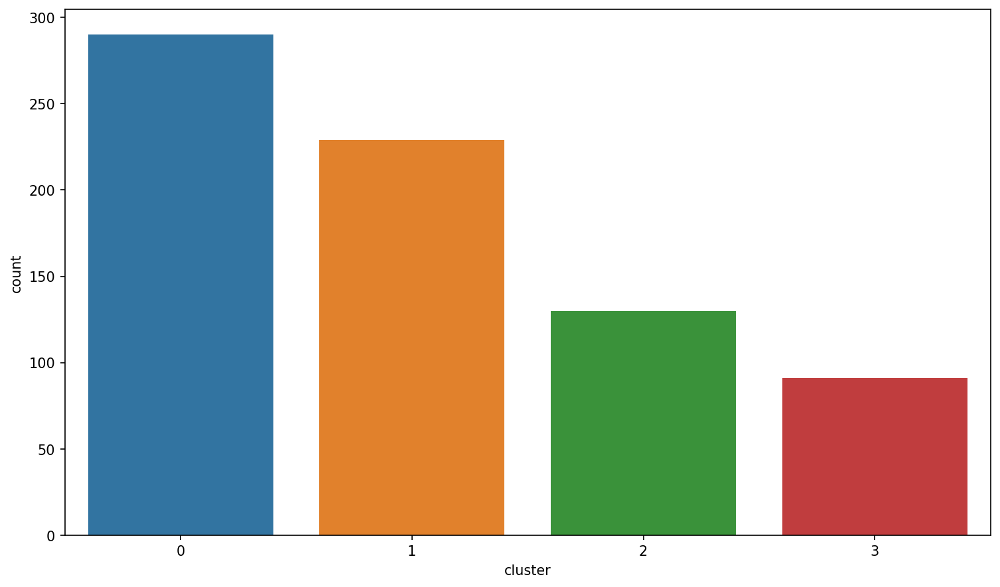

In [181]:
plt.figure(figsize=(12,7),dpi=150)
sns.countplot(x='cluster',data=emp)

In [221]:
emp.cluster[emp.cluster==0].value_counts()

0    290
Name: cluster, dtype: int64

In [281]:
absent=pd.DataFrame({"ID's":[list(emp[emp.cluster==0].ID.unique()),list(emp[emp.cluster==1].ID.unique()),list(emp[emp.cluster==2].ID.unique()),list(emp[emp.cluster==3].ID.unique())],\
'Counts':[emp.cluster[emp.cluster==0].value_counts().values,emp.cluster[emp.cluster==1].value_counts().values,emp.cluster[emp.cluster==2].value_counts().values,emp.cluster[emp.cluster==3].value_counts().values],\
'season':[{1:109,2:99,3:82},{2:92,3:74,1:61,4:2},{4:108,3:21,2:1},{4:85,3:6}],
'Day of week':[{4:    64,
2:    63,
6  :  60,
3  :  58,
5   : 45},{2   : 53,
3   : 48,
4    :45,
6   : 42,
5   : 41},{6    :30,
2    :26,
3  :  26,
4  :  25,
5    :23},{3   : 22,
4  :  22,
2  :  19,
5   : 16,
6   : 12}]},
    index=['cluster_0','cluster_1','cluster_2','cluster_3'])
abs=pd.ExcelWriter('Absent.xlsx')
absent.to_excel(abs)
abs.save()
absent

,ID's,Counts,season,Day of week
cluster_0,"[11, 36, 3, 7, 10, 20, 14, 24, 30, 19, 5, 15, ...",[290],"{1: 109, 2: 99, 3: 82}","{4: 64, 2: 63, 6: 60, 3: 58, 5: 45}"
cluster_1,"[1, 6, 33, 18, 2, 27, 34, 28, 22, 31, 17, 23, ...",[229],"{2: 92, 3: 74, 1: 61, 4: 2}","{2: 53, 3: 48, 4: 45, 6: 42, 5: 41}"
cluster_2,"[15, 20, 11, 36, 3, 13, 10, 14, 7, 24, 5, 30, ...",[130],"{4: 108, 3: 21, 2: 1}","{6: 30, 2: 26, 3: 26, 4: 25, 5: 23}"
cluster_3,"[29, 28, 34, 33, 22, 17, 6, 1, 2, 18, 31, 32, ...",[91],"{4: 85, 3: 6}","{3: 22, 4: 22, 2: 19, 5: 16, 6: 12}"


In [262]:
emp.columns

Index(['ID', 'Reason for absence', 'Month of absence', 'Day of the week',
       'Seasons', 'Transportation expense', 'Distance from Residence to Work',
       'Service time', 'Age', 'Work load Average/day ', 'Hit target',
       'Disciplinary failure', 'Education', 'Son', 'Social drinker',
       'Social smoker', 'Pet', 'Weight', 'Height', 'Body mass index',
       'Absenteeism time in hours', 'cluster'],
      dtype='object')

In [278]:
emp[emp.cluster==3]['Day of the week'].value_counts()

3    22
4    22
2    19
5    16
6    12
Name: Day of the week, dtype: int64

In [ ]:
detail=name.copy()

In [ ]:
detail['cluster']=final_pca_hc.fit(df).named_steps['clf'].labels_

In [249]:
import ipywidgets as widgets
id=widgets.Dropdown(options=[('cluster_0',0),('cluster_1',1),('cluster_2',2),('cluster_3',3)],value=2,description='Cluster',disabled=False)
id

Dropdown(description='Cluster', index=2, options=(('cluster_0', 0), ('cluster_1', 1), ('cluster_2', 2), ('clus…

In [254]:
def data(a):
    return detail[detail.cluster==a]
data(id.value)

,ID,Reason for absence,Month of absence,Day of the week,Seasons,Transportation expense,Distance from Residence to Work,Service time,Age,Work load Average/day,...,Education,Son,Social drinker,Social smoker,Pet,Weight,Height,Body mass index,Absenteeism time in hours,cluster
9,1,patient follow-up,7,Monday,summer,235,11,14,37,239.554,...,postgraduate,1,no,no,1,88,172,29,8,1
18,6,Diseases of the skin and subcutaneous tissue,7,Thursday,summer,189,29,13,33,239.554,...,high school,2,no,no,2,69,167,25,8,1
19,33,medical consultation,8,Wednesday,summer,248,25,14,47,205.917,...,high school,2,no,no,1,86,165,32,2,1
20,18,Diseases of the digestive system,8,Wednesday,summer,330,16,4,28,205.917,...,graduate,0,no,no,0,84,182,25,8,1
31,2,"Injury, poisoning and certain other consequenc...",8,Thursday,summer,235,29,12,48,205.917,...,high school,1,no,yes,5,88,163,33,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,6,patient follow-up,7,Tuesday,summer,189,29,13,33,264.604,...,high school,2,no,no,2,69,167,25,16,1
731,34,medical consultation,7,Wednesday,summer,118,10,10,37,264.604,...,high school,0,no,no,0,83,172,28,2,1
733,28,patient follow-up,7,Wednesday,summer,225,26,9,28,264.604,...,high school,1,no,no,2,69,169,24,8,1
736,1,Diseases of the skin and subcutaneous tissue,7,Tuesday,summer,235,11,14,37,264.604,...,postgraduate,1,no,no,1,88,172,29,4,1
